In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sb
from matplotlib.pyplot import rc_context
import celltypist
mpl.rcParams['pdf.fonttype'] = 42
# mpl.rcParams["font.sans-serif"] = "Arial"
# %config InlineBackend.figure_format = 'retina'
sc.set_figure_params(dpi=50, dpi_save=300, figsize=(5, 5),color_map='Reds')

In [2]:
adata_full=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_extend_with_meta.h5ad')

In [3]:
# adata_full=adata_full[adata_full.obs['Project']!=]
adata_full

AnnData object with n_obs × n_vars = 616557 × 25238
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'project', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_1.0', 'Dataset', 'segment', 'stage', 'age', 'weaned', 'disease', 'gender', 'region', 'breed', 'platform', 'sequence_method', 'Project'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'predicted_labels_colors', 'project_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    obsp: 'connectivities', 'distances'

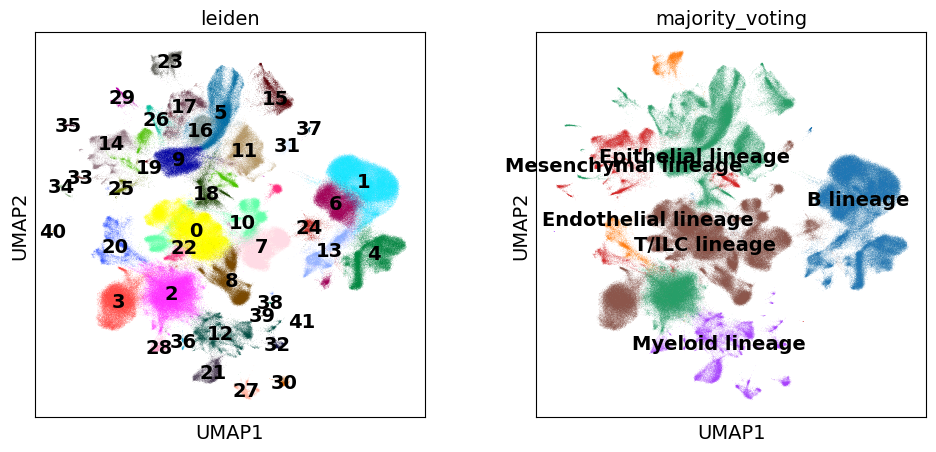

In [30]:
sc.pl.umap(adata_full,color=['leiden','majority_voting'],legend_loc='on data')

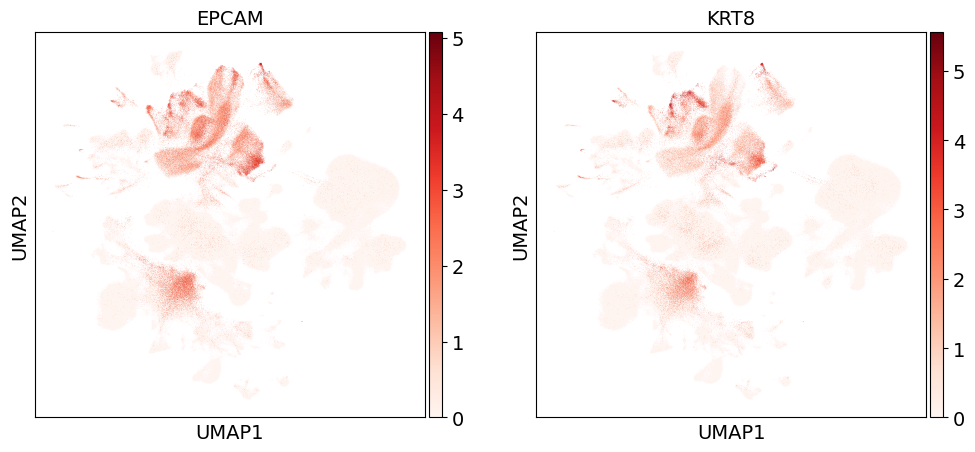

In [22]:
sc.pl.umap(adata_full,color=['EPCAM', 'KRT8'])

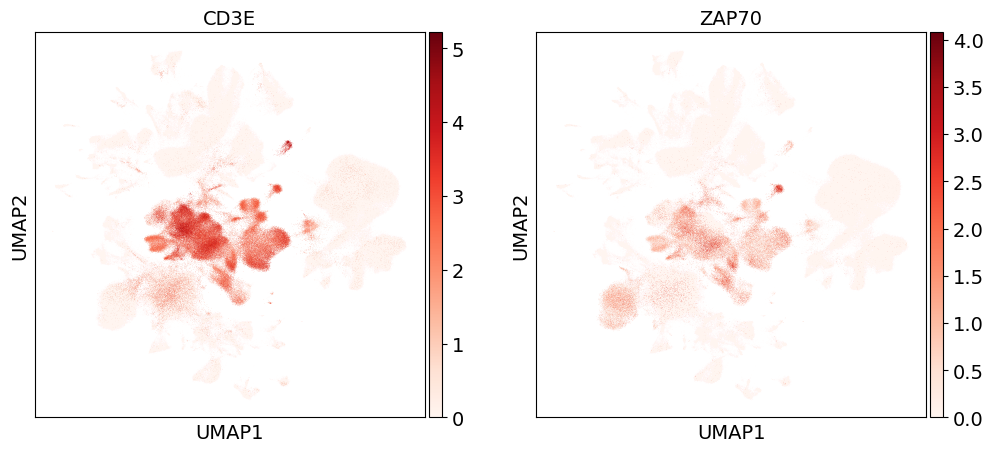

In [ ]:
sc.pl.umap(adata_full,color=['CD3E', 'ZAP70'])

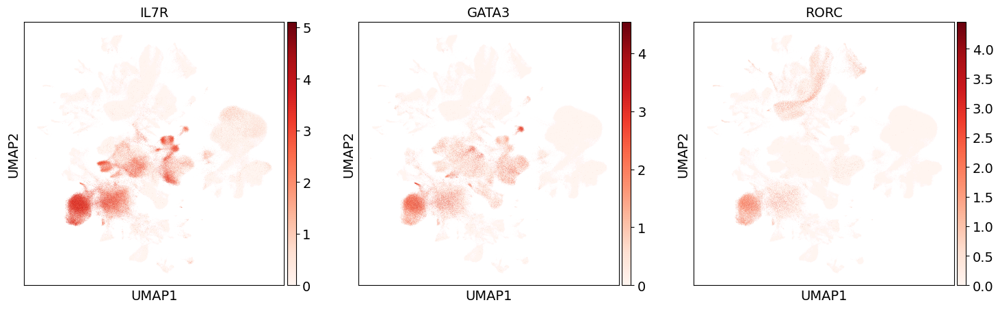

In [ ]:
# ILC
sc.pl.umap(adata_full,color=['IL7R', 'GATA3','RORC'])

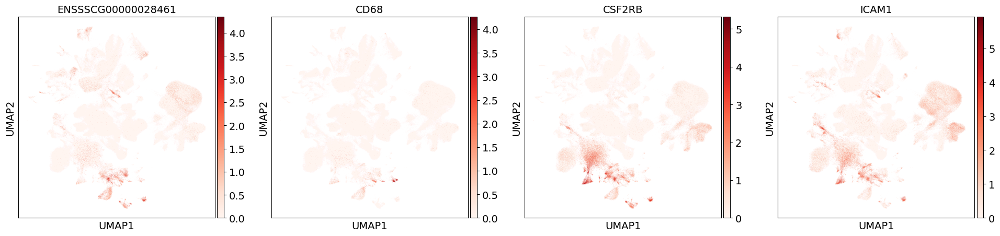

In [25]:
sc.pl.umap(adata_full,color=['ENSSSCG00000028461', 'CD68', 'CSF2RB', 'ICAM1'])

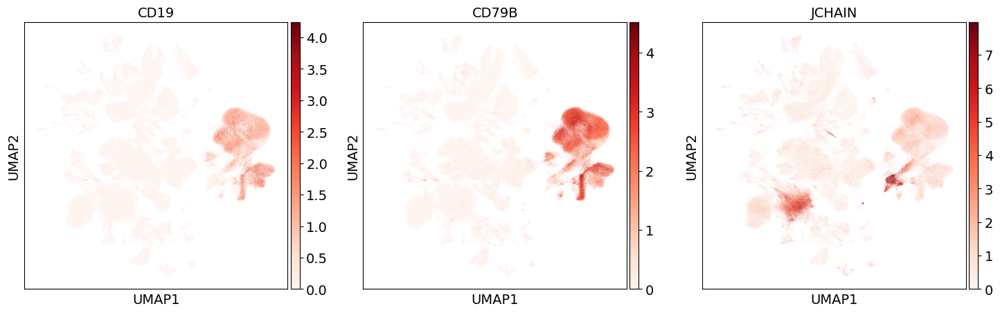

In [26]:
sc.pl.umap(adata_full,color=['CD19', 'CD79B', 'JCHAIN'])

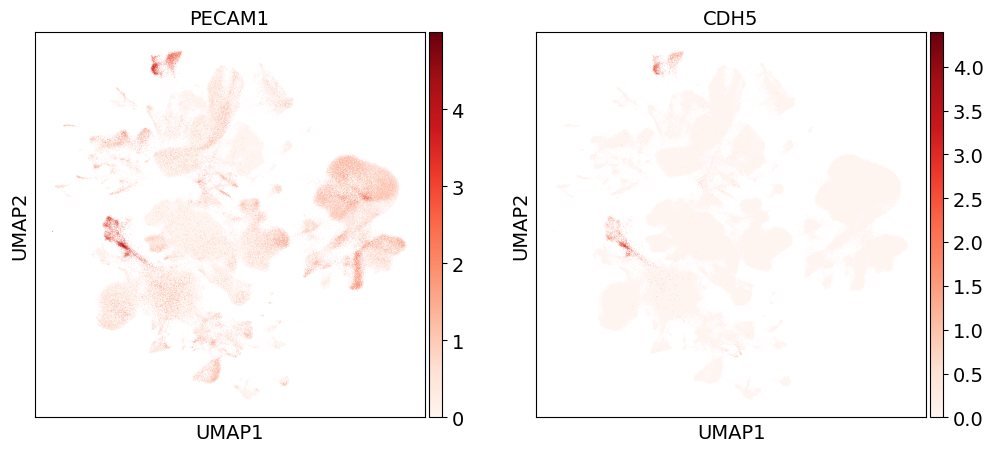

In [27]:
sc.pl.umap(adata_full,color=['PECAM1','CDH5'])

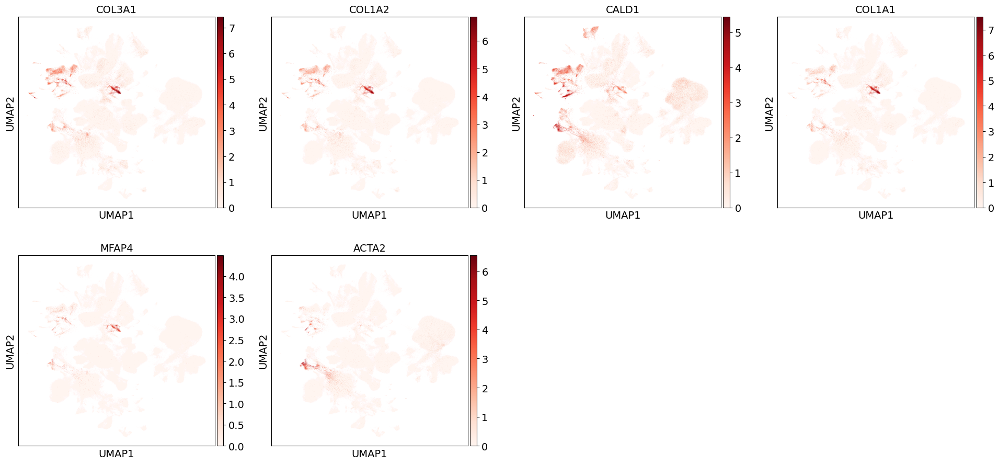

In [28]:
sc.pl.umap(adata_full,color=['COL3A1','COL1A2','CALD1','COL1A1', 'MFAP4','ACTA2'])

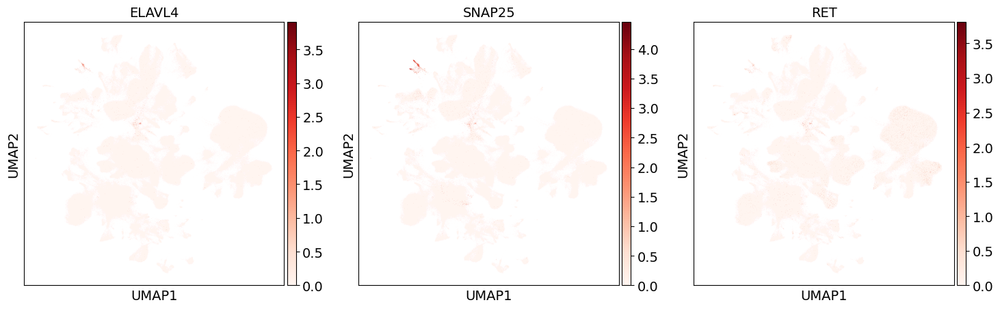

In [53]:
sc.pl.umap(adata_full,color=['ELAVL4','SNAP25','RET'])

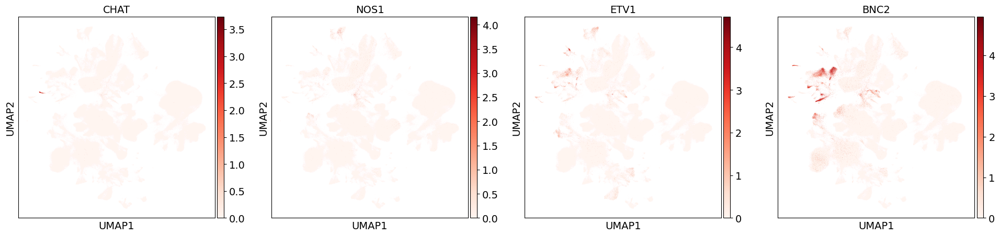

In [ ]:
sc.pl.umap(adata_full,color=['CHAT','NOS1','ETV1','BNC2'])

In [31]:
subset=adata_full[adata_full.obs['leiden']=='2']

In [33]:
subset.obs['Project'].value_counts()

PRJNA907920     56777
CRA010843        2048
PRJNA975751       292
PRJNA802582       218
PRJNA970265       208
CRA018161          73
PRJNA1246084       29
Name: Project, dtype: int64

In [41]:
adata_full.obs['Lineage']=adata_full.obs['majority_voting']

In [42]:
import numpy as np
adata_full.obs["Lineage"] = np.where(
    adata_full.obs["leiden"] == "2",
    "T/ILC lineage",
    adata_full.obs["Lineage"]
)

In [ ]:

adata_full.obs["Lineage"] = np.where(
    adata_full.obs["leiden"].isin(["29","33"]),
    "Neuron lineage",
    adata_full.obs["Lineage"]
)

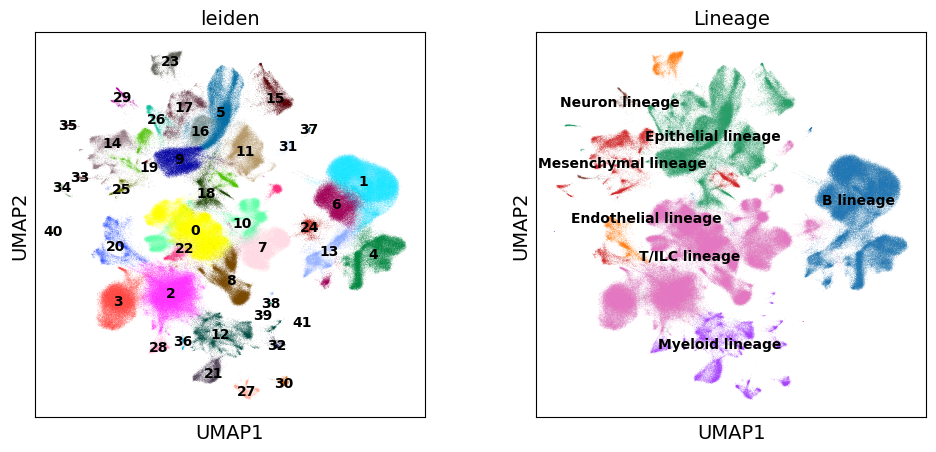

In [55]:
sc.pl.umap(adata_full,color=['leiden','Lineage'],legend_loc='on data',legend_fontsize=10)

In [56]:
adata_full.write('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_extend_lineage.h5ad')

### celltypist for each lineage

In [5]:
adata_full=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_extend_lineage.h5ad')

In [5]:
adata_full.obs['Lineage'].unique()

['T/ILC lineage', 'Myeloid lineage', 'B lineage', 'Epithelial lineage', 'Mesenchymal lineage', 'Endothelial lineage', 'Neuron lineage']
Categories (7, object): ['B lineage', 'Endothelial lineage', 'Epithelial lineage', 'Mesenchymal lineage', 'Myeloid lineage', 'Neuron lineage', 'T/ILC lineage']

In [6]:
ap={}
path_dict={
    'B lineage':'/disk212/yupf/database/web/streamlit/asset/pkl/B_lineage.pkl',
    'Endothelial lineage':'/disk212/yupf/database/web/streamlit/asset/pkl/Endothelial_lineage.pkl',
    'Epithelial lineage':'/disk212/yupf/database/web/streamlit/asset/pkl/Epithelial_lineage.pkl',
    'Mesenchymal lineage':'/disk212/yupf/database/web/streamlit/asset/pkl/Mesenchymal_lineage.pkl',
    'Myeloid lineage':'/disk212/yupf/database/web/streamlit/asset/pkl/Myeloid_lineage.pkl',
    'T/ILC lineage':'/disk212/yupf/database/web/streamlit/asset/pkl/T_ILC_lineage.pkl',
    'Neuron lineage':'/disk212/yupf/database/web/streamlit/asset/pkl/Neuronal_lineage.pkl'
}

🔬 Input data has 264945 cells and 25238 genes
🔗 Matching reference genes in the model
🧬 2567 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


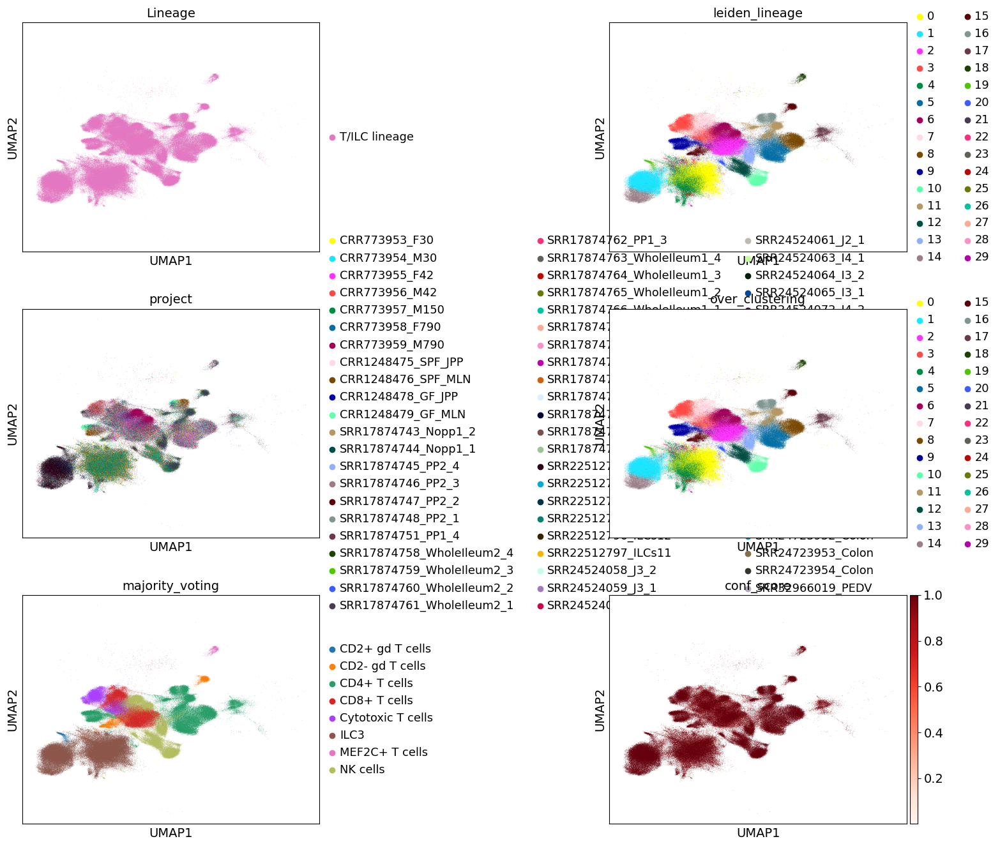

🔬 Input data has 31933 cells and 25238 genes
🔗 Matching reference genes in the model
🧬 1888 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


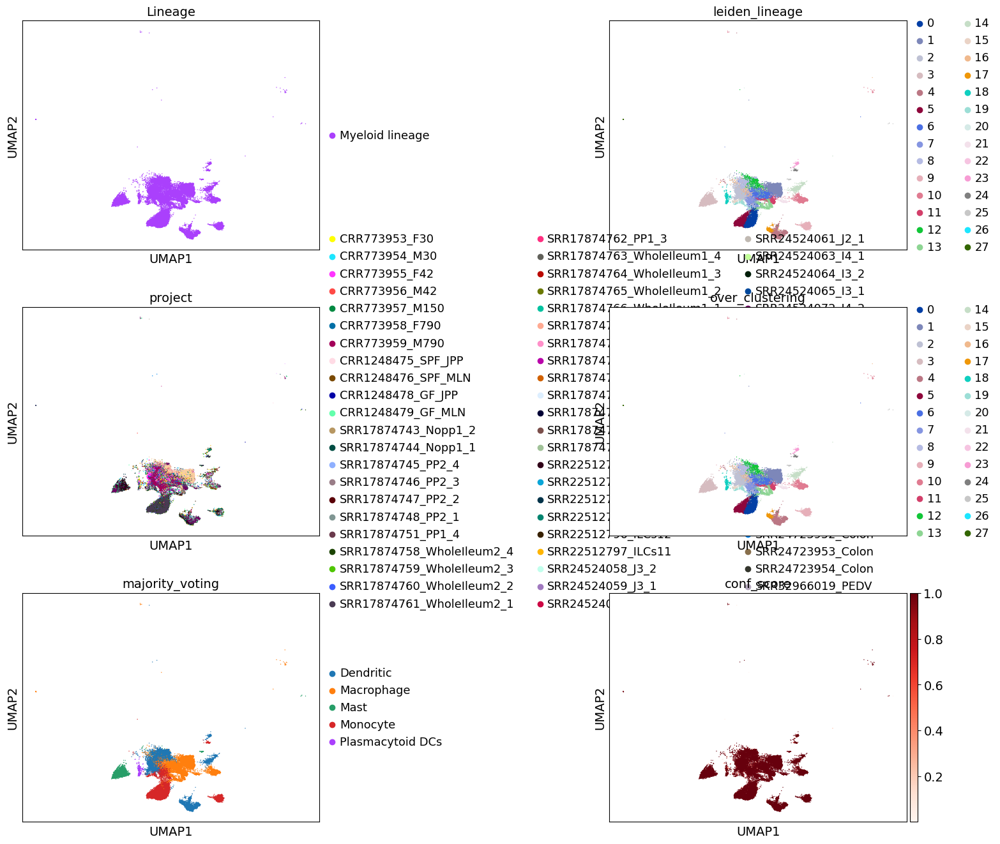

🔬 Input data has 152109 cells and 25238 genes
🔗 Matching reference genes in the model
🧬 1498 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


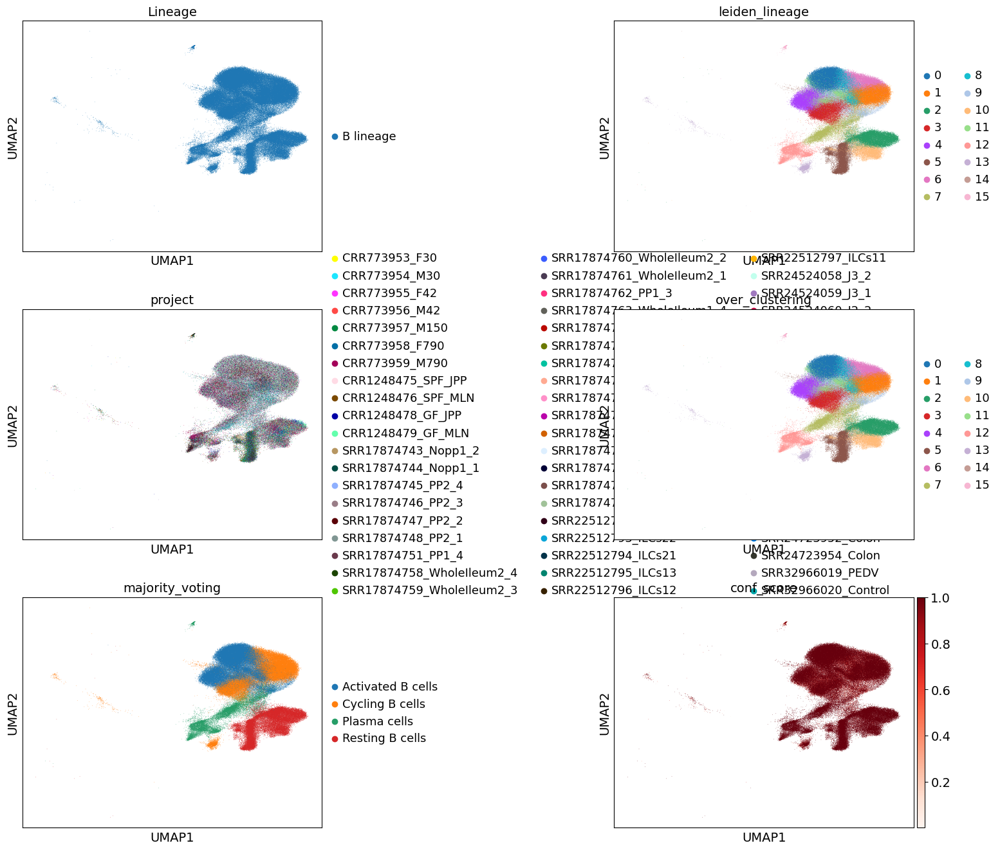

🔬 Input data has 124468 cells and 25238 genes
🔗 Matching reference genes in the model
🧬 3257 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


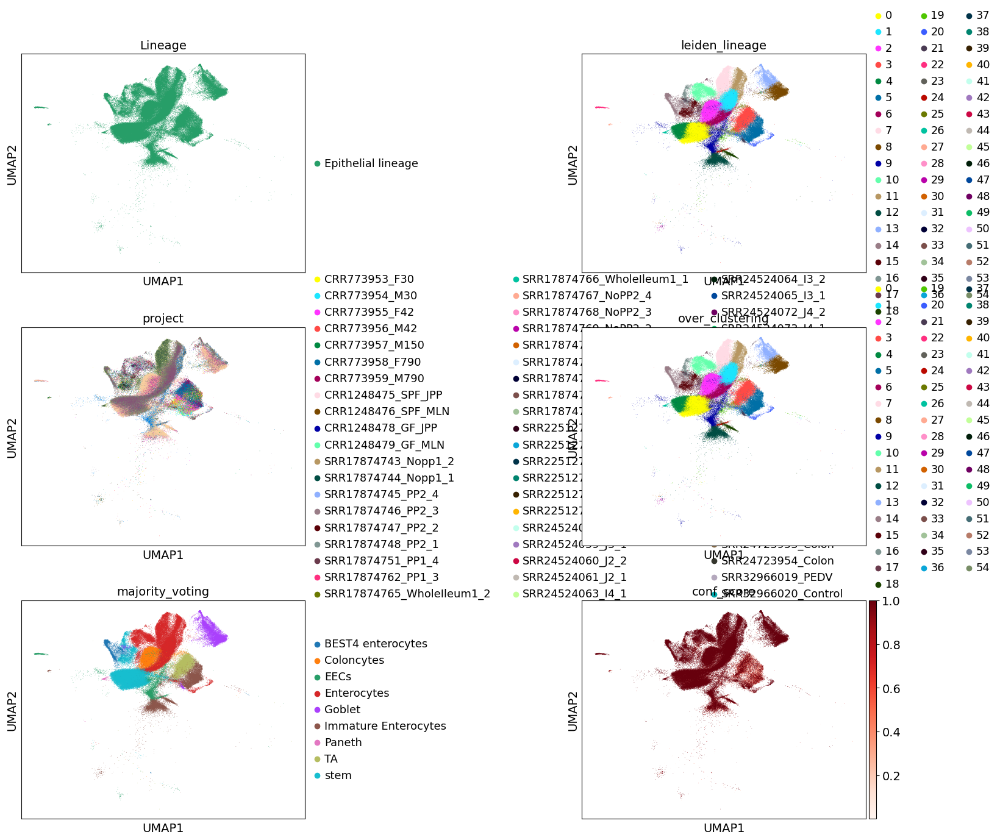

🔬 Input data has 27586 cells and 25238 genes
🔗 Matching reference genes in the model
🧬 2349 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


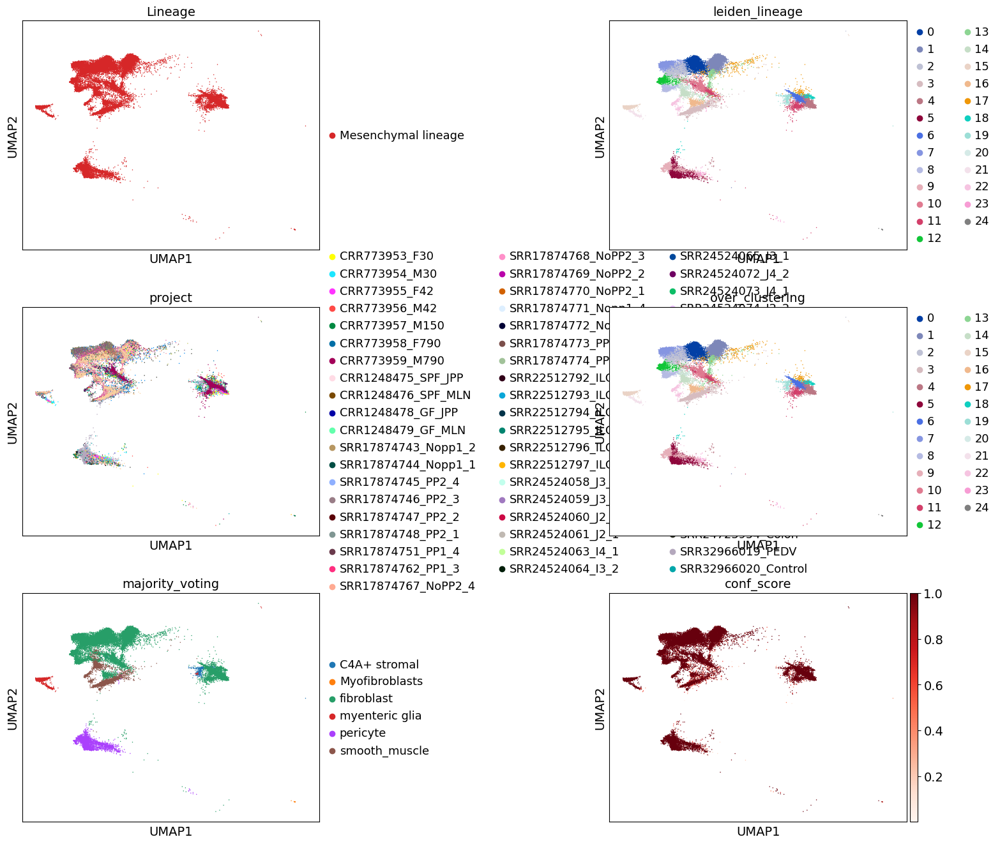

🔬 Input data has 12882 cells and 25238 genes
🔗 Matching reference genes in the model
🧬 1201 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


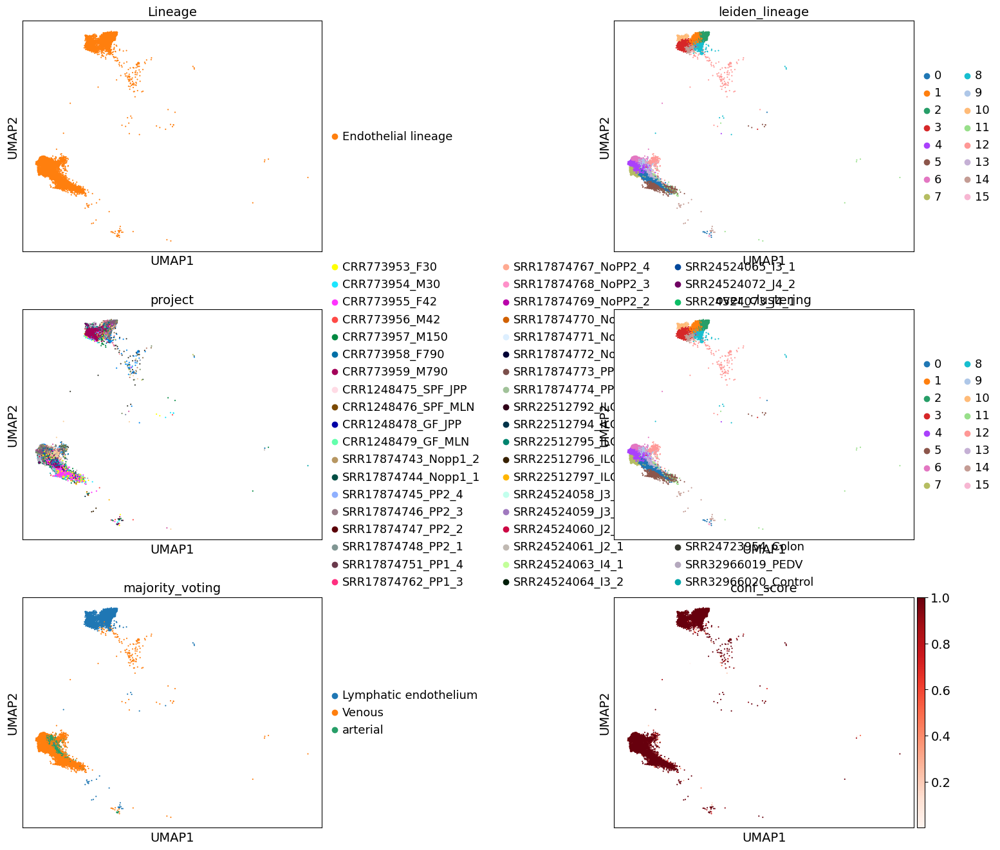

🔬 Input data has 2634 cells and 25238 genes
🔗 Matching reference genes in the model
🧬 1841 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


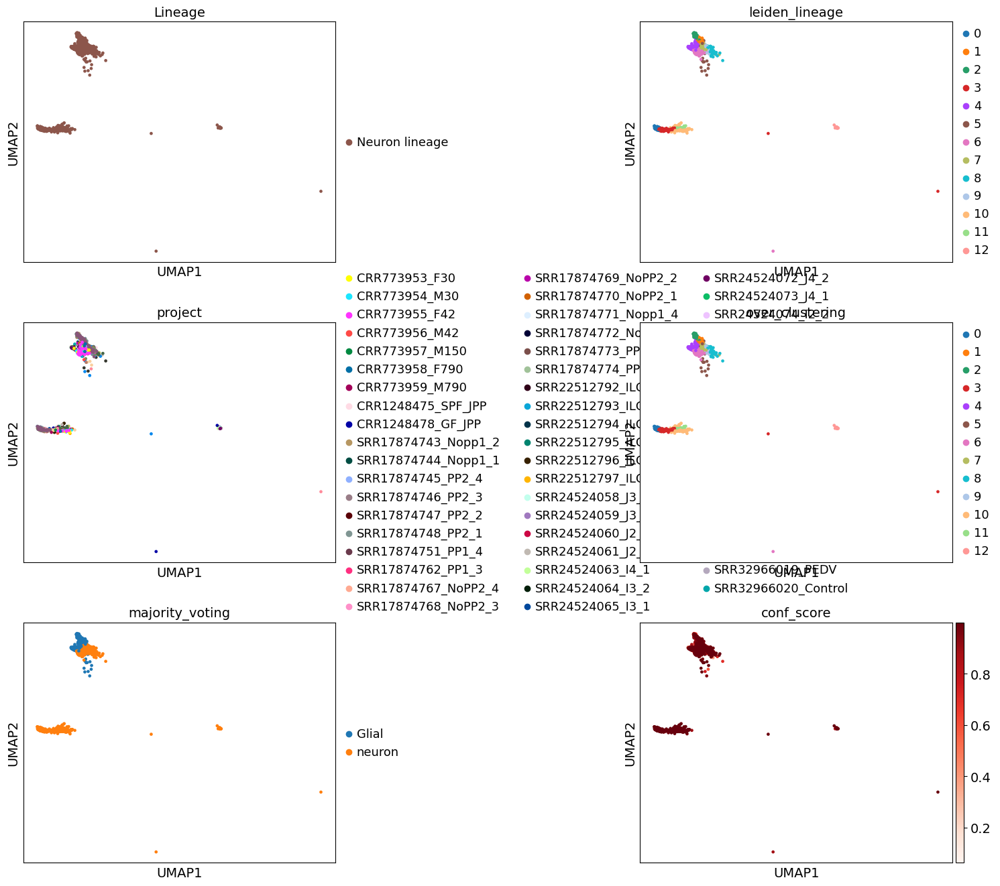

In [7]:
for i in adata_full.obs['Lineage'].unique():
    ap[i]=adata_full[adata_full.obs['Lineage']==i]
    sc.tl.leiden(ap[i], resolution=1, key_added='leiden_lineage')
    predictions = celltypist.annotate(ap[i], model = path_dict[i], majority_voting = True,over_clustering='leiden_lineage')
    ap[i] = predictions.to_adata()
    sc.pl.umap(ap[i], color=['Lineage','leiden_lineage', 'project','over_clustering', 'majority_voting', 'conf_score'],ncols=2,wspace=0.8)

Epi adjusted

In [8]:
ap['Epithelial lineage']

AnnData object with n_obs × n_vars = 124468 × 25238
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'project', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_1.0', 'Dataset', 'segment', 'stage', 'age', 'weaned', 'disease', 'gender', 'region', 'breed', 'platform', 'sequence_method', 'Project', 'Lineage', 'leiden_lineage'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Lineage_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'predicted_labels_colors', 'project_colors', 'umap', 'leiden_lineage', 'leiden_lineage_colors', 'over_clustering_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_ext

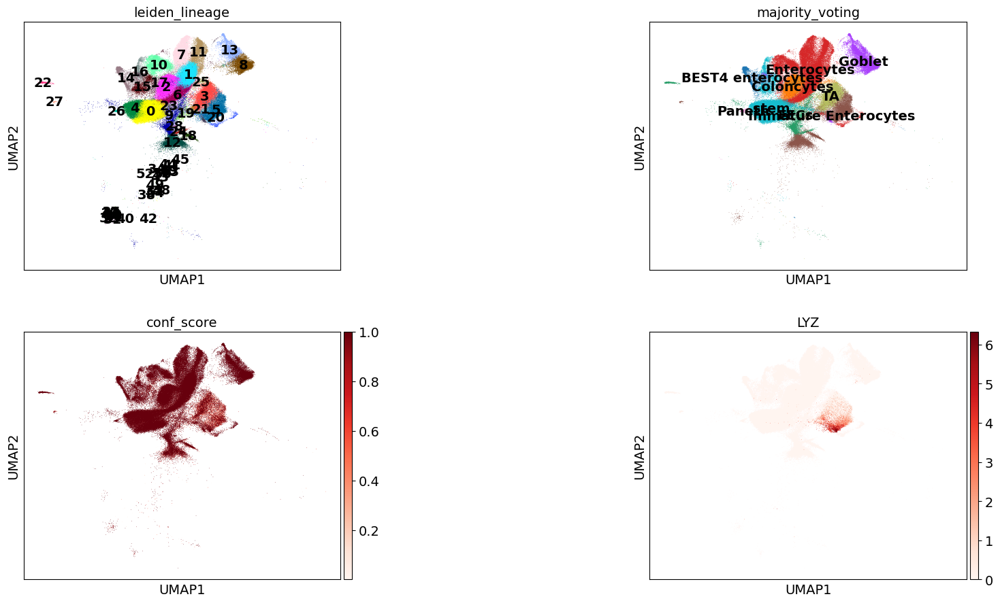

In [9]:
sc.pl.umap(ap['Epithelial lineage'], color=['leiden_lineage',  'majority_voting', 'conf_score','LYZ'],legend_loc='on data',ncols=2,wspace=0.8)

In [10]:
import numpy as np
ap['Epithelial lineage'].obs['conf_score'] = np.where(
    ap['Epithelial lineage'].obs["leiden_lineage"].isin(['5','20']),
    2,
    ap['Epithelial lineage'].obs['conf_score']
)

In [11]:

ap['Epithelial lineage'].obs['majority_voting'] = np.where(
    ap['Epithelial lineage'].obs["leiden_lineage"].isin(['5','20']),
    "Paneth",
    ap['Epithelial lineage'].obs['majority_voting']
)

... storing 'majority_voting' as categorical


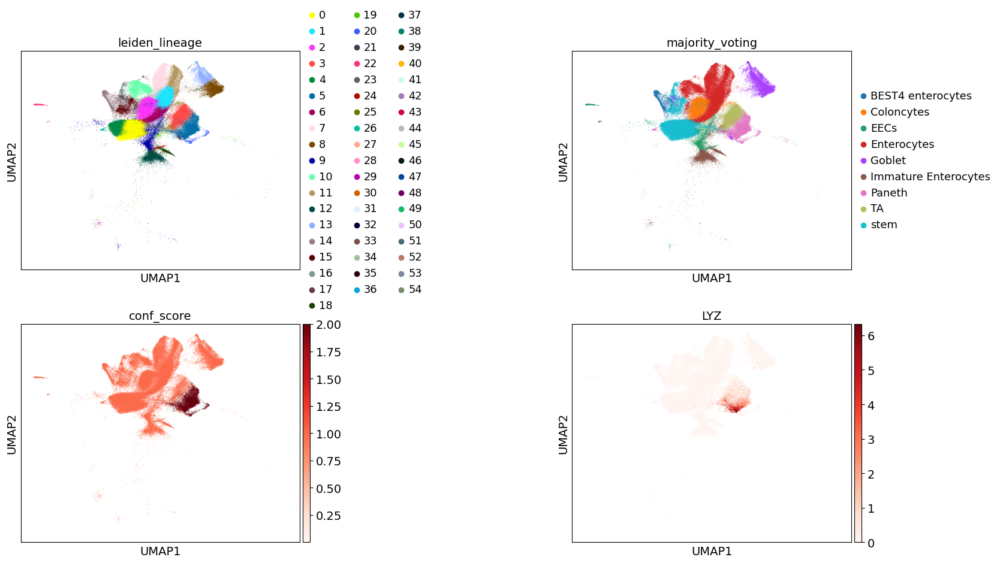

In [12]:
sc.pl.umap(ap['Epithelial lineage'], color=['leiden_lineage',  'majority_voting', 'conf_score','LYZ'],ncols=2,wspace=0.8)

ILC

In [15]:
ILC=ap['T/ILC lineage'][ap['T/ILC lineage'].obs['majority_voting']=='ILC3']

In [16]:
ILC

View of AnnData object with n_obs × n_vars = 95275 × 25238
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'project', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_1.0', 'Dataset', 'segment', 'stage', 'age', 'weaned', 'disease', 'gender', 'region', 'breed', 'platform', 'sequence_method', 'Project', 'Lineage', 'leiden_lineage'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Lineage_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'project_colors', 'umap', 'leiden_lineage', 'leiden_lineage_colors', 'over_clustering_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'

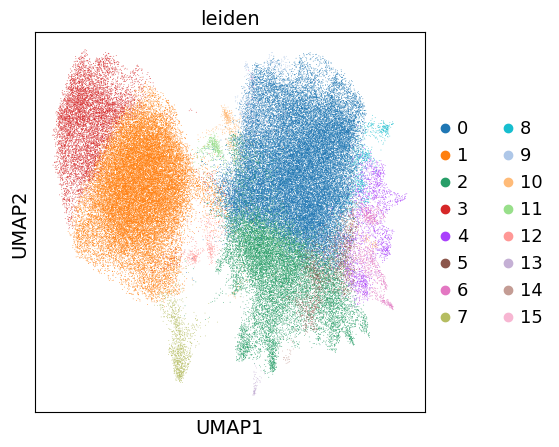

In [55]:
sc.pp.neighbors(ILC, use_rep = 'X_scVI')
sc.tl.umap(ILC)
sc.tl.leiden(ILC, resolution = 0.5)
sc.pl.umap(ILC, color='leiden')

CD2 is in T.var_names
KIT is in T.var_names
IL7R is in T.var_names
IL23R is in T.var_names
NCR is not in T.var_names
AHR is in T.var_names


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

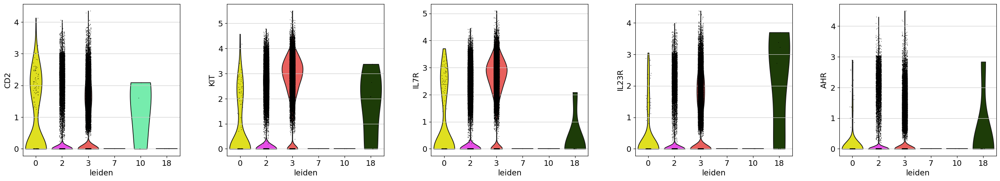

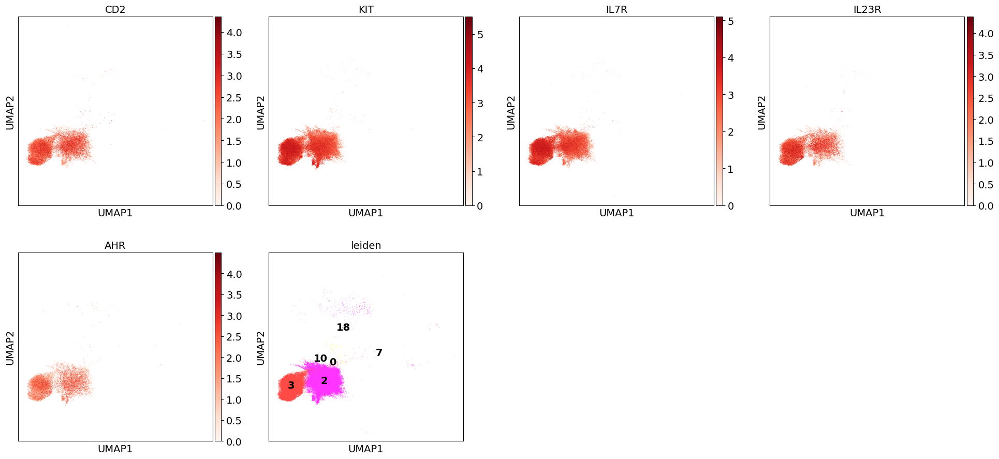

In [17]:
#ILC3
Glist=['CD2','KIT','IL7R','IL23R','NCR','AHR']
for i in Glist[:]:
    if i  in ILC.var_names:
        print(i+' is in T.var_names')
    else:
        Glist.remove(i)
        print(i+' is not in T.var_names')
sc.pl.violin(ILC, keys=Glist,groupby='leiden')
Glist.append('leiden')
# Glist.append('CellType')
sc.pl.umap(ILC, color=Glist,legend_loc='on data')

CD3G is in T.var_names
CD247 is in T.var_names
CD96 is in T.var_names
SLA-DRA is not in T.var_names
ITGAE is in T.var_names


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

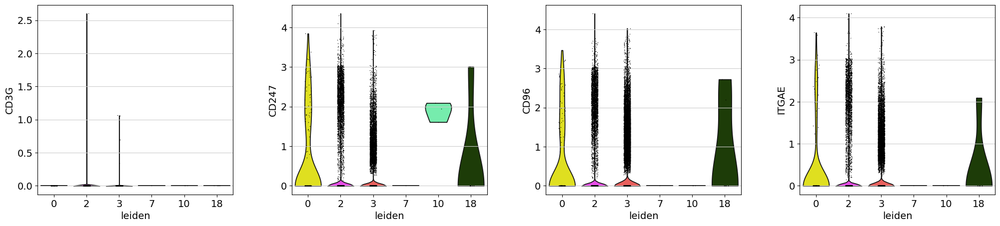

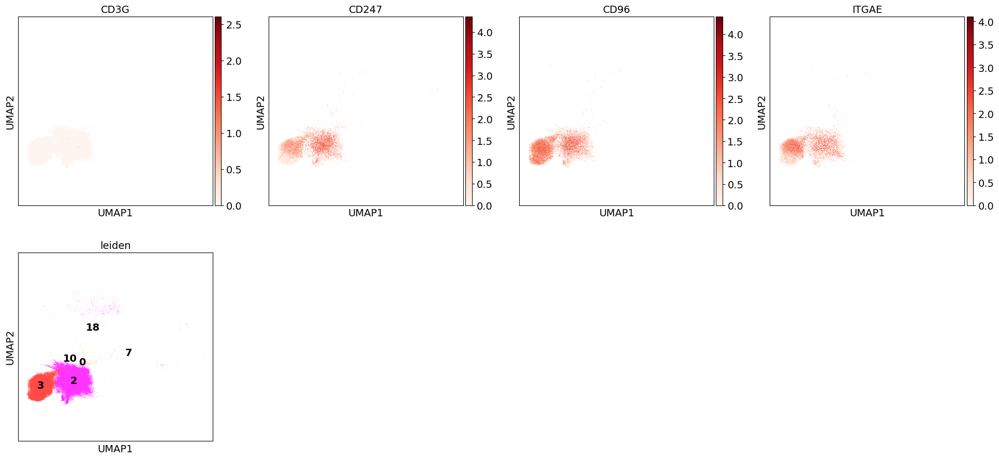

In [18]:
# ILC1
Glist=['CD3G','CD247','CD96','SLA-DRA','ITGAE']
for i in Glist[:]:
    if i  in ILC.var_names:
        print(i+' is in T.var_names')
    else:
        Glist.remove(i)
        print(i+' is not in T.var_names')
sc.pl.violin(ILC, keys=Glist,groupby='leiden')
Glist.append('leiden')
# Glist.append('CellType')
sc.pl.umap(ILC, color=Glist,legend_loc='on data')

PTGDR2 is in T.var_names
CD44 is in T.var_names
CD81 is in T.var_names
CCR9 is in T.var_names


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

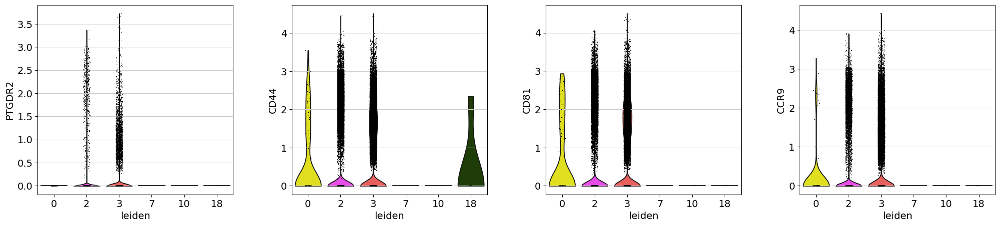

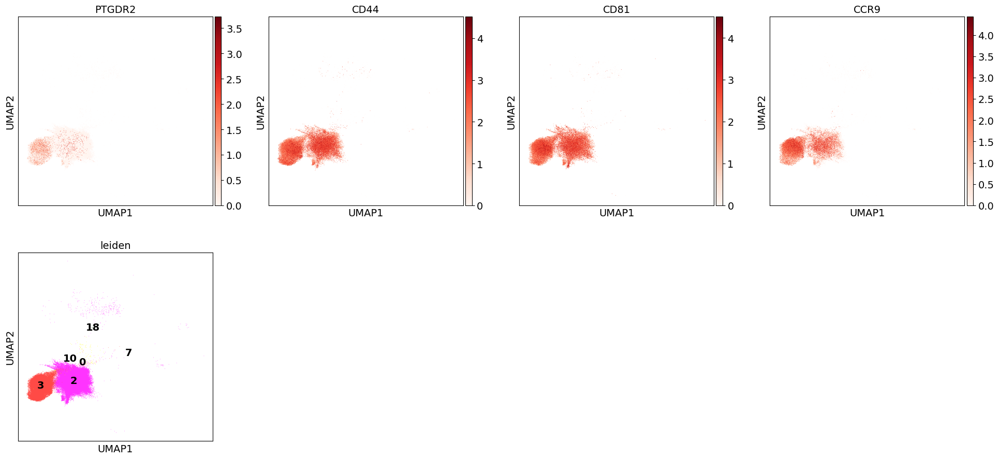

In [19]:
Glist=['PTGDR2','CD44','CD81','CCR9']
for i in Glist[:]:
    if i  in ILC.var_names:
        print(i+' is in T.var_names')
    else:
        Glist.remove(i)
        print(i+' is not in T.var_names')
sc.pl.violin(ILC, keys=Glist,groupby='leiden')
Glist.append('leiden')
# Glist.append('CellType')
sc.pl.umap(ILC, color=Glist,legend_loc='on data')

In [20]:
adata_concat=sc.concat(ap.values(),keys=ap.keys(),label='Lineage',join='outer')
adata_concat

AnnData object with n_obs × n_vars = 616557 × 25238
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'project', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_1.0', 'Dataset', 'segment', 'stage', 'age', 'weaned', 'disease', 'gender', 'region', 'breed', 'platform', 'sequence_method', 'Project', 'Lineage', 'leiden_lineage'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'

In [21]:
adata_concat=adata_concat[adata_concat.obs['conf_score']>0.8]
adata_concat

View of AnnData object with n_obs × n_vars = 485026 × 25238
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'project', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_1.0', 'Dataset', 'segment', 'stage', 'age', 'weaned', 'disease', 'gender', 'region', 'breed', 'platform', 'sequence_method', 'Project', 'Lineage', 'leiden_lineage'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'

In [24]:
adata_concat.obs['CellType'] = adata_concat.obs['majority_voting']

In [25]:
adata_concat.write('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/celltypist_data/extend_conf08.h5ad')